<a href="https://colab.research.google.com/github/MayurBhama/21-Data-Science-Projects/blob/main/Project_10_Creative_AI_Generating_Art_with_Neural_Style_Transfer___Training_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import time
from tqdm import tqdm
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt

IMAGE_SHAPE = (128, 128, 3)
NOISE_DIM = 100
BATCH_SIZE = 128
EPOCHS = 50
DATA_PATH = '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/'

def preprocess_image(file_path):
    img_raw = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img_raw, channels=3)
    img = tf.image.resize(img, (IMAGE_SHAPE[0], IMAGE_SHAPE[1]))
    img = (img / 127.5) - 1.0  # Normalize to [-1, 1]
    return img

def load_celeba_images(path):
    all_files = [os.path.join(path, f) for f in os.listdir(path)[:10000] if f.endswith('.jpg')]
    dataset = tf.data.Dataset.from_tensor_slices(all_files)
    dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

    images_list = []
    for batch in tqdm(dataset.batch(1024).prefetch(tf.data.AUTOTUNE)):
        images_list.append(batch)

    return tf.concat(images_list, axis=0)

images = load_celeba_images(DATA_PATH)
dataset = tf.data.Dataset.from_tensor_slices(images) \
                         .shuffle(buffer_size=50000) \
                         .batch(BATCH_SIZE) \
                         .prefetch(tf.data.AUTOTUNE)

100%|██████████| 10/10 [00:06<00:00,  1.59it/s]


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

def build_generator(NOISE_DIM=NOISE_DIM):
    model = tf.keras.Sequential([
        # 1) Start with a dense layer that reshapes to 8x8 with 512 channels
        layers.Dense(8*8*512, use_bias=False, input_shape=(NOISE_DIM,)),
        layers.Reshape((8, 8, 512)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 2) Upsample to 16x16
        layers.Conv2DTranspose(256, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 3) Upsample to 32x32
        layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 4) Upsample to 64x64
        layers.Conv2DTranspose(64, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 5) Upsample to 128x128
        layers.Conv2DTranspose(32, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 6) Final layer → 128x128x3, use tanh for output in [-1,1]
        layers.Conv2DTranspose(3, (4,4), strides=(1,1), padding='same', use_bias=False, activation='tanh')
    ], name="Generator")

    return model


def build_discriminator():
    model = tf.keras.Sequential([
        # 1) Downsample from 128x128 to 64x64
        layers.Conv2D(64, (4,4), strides=(2,2), padding='same',
                      input_shape=(128,128,3)),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 2) Downsample to 32x32
        layers.Conv2D(128, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 3) Downsample to 16x16
        layers.Conv2D(256, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 4) Downsample to 8x8
        layers.Conv2D(512, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 5) Flatten to a single logit
        layers.Flatten(),
        layers.Dense(1)
    ], name="Discriminator")

    return model

In [ ]:
generator = build_generator()
discriminator = build_discriminator()


cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [ ]:
def train_step(real_images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        # Ensure shapes match
        assert generated_images.shape[1:] == IMAGE_SHAPE, "Generated image shape mismatch!"
        assert real_images.shape[1:] == IMAGE_SHAPE, "Real image shape mismatch!"

        real_output = discriminator(real_images, training=True)
        fake_output = discriminator(generated_images, training=True)

        g_loss = generator_loss(fake_output)
        d_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(g_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(d_loss, discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return g_loss, d_loss


def generate_and_show_images(noise):
    # Generate images
    preds = generator(noise, training=False)
    preds = (preds + 1) / 2.0  # Shift from [-1,1] to [0,1]

    # Plot
    fig = plt.figure(figsize=(4,4))
    for i in range(preds.shape[0]):
        plt.subplot(4,4,i+1)
        plt.imshow(preds[i])
        plt.axis('off')
    plt.show()

In [ ]:
# def train(dataset, epochs):
#     fixed_noise = tf.random.normal([16, NOISE_DIM])  # Fixed noise for generating sample images
#     total_start_time = time.time()  # Start time for total training

#     for epoch in range(epochs):
#         epoch_start_time = time.time()  # Start time for the current epoch

#         g_losses = []
#         d_losses = []

#         for image_batch in dataset:
#             g_loss, d_loss = train_step(image_batch)
#             g_losses.append(g_loss)
#             d_losses.append(d_loss)

#         # Calculate average losses for the epoch
#         avg_g_loss = tf.reduce_mean(g_losses)
#         avg_d_loss = tf.reduce_mean(d_losses)

#         # Time taken for the epoch
#         epoch_end_time = time.time()
#         epoch_duration = epoch_end_time - epoch_start_time

#         # Print epoch details
#         print(f"Epoch {epoch+1}/{epochs} | "
#               f"Generator loss: {avg_g_loss:.4f}, "
#               f"Discriminator loss: {avg_d_loss:.4f} | "
#               f"Time: {epoch_duration:.2f} seconds")

#         # Generate and show images for the current epoch
#         generate_and_show_images(fixed_noise)

#     # Total time taken for training
#     total_end_time = time.time()
#     total_duration = total_end_time - total_start_time
#     print(f"\nTotal Training Time: {total_duration:.2f} seconds")

In [ ]:
import tensorflow as tf
strategy = tf.distribute.MirroredStrategy(devices=["/gpu:0", "/gpu:1"])

with strategy.scope():
    generator = build_generator()
    discriminator = build_discriminator()

    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    def generator_loss(fake_output):
        return cross_entropy(tf.ones_like(fake_output), fake_output)

    def discriminator_loss(real_output, fake_output):
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        return real_loss + fake_loss

    gen_optimizer = tf.keras.optimizers.Adam(1e-4)
    disc_optimizer = tf.keras.optimizers.Adam(1e-4)

# Existing dataset creation
dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(10000).batch(BATCH_SIZE)

# Make a distributed dataset
dist_dataset = strategy.experimental_distribute_dataset(dataset)

@tf.function

def distributed_train_step(dataset_inputs):
    def step_fn(real_images):
        return train_step(real_images)  # The train_step you already have

    per_replica_g_loss, per_replica_d_loss = strategy.run(step_fn, args=(dataset_inputs,))
    mean_g_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_g_loss, axis=None)
    mean_d_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_d_loss, axis=None)
    return mean_g_loss, mean_d_loss


def train(dataset, epochs):
    fixed_noise = tf.random.normal([16, NOISE_DIM])
    total_start_time = time.time()

    for epoch in range(epochs):
        epoch_start_time = time.time()

        g_losses = []
        d_losses = []

        for image_batch in dist_dataset:  # Use distributed dataset
            g_loss, d_loss = distributed_train_step(image_batch)
            g_losses.append(g_loss)
            d_losses.append(d_loss)

        avg_g_loss = tf.reduce_mean(g_losses)
        avg_d_loss = tf.reduce_mean(d_losses)

        epoch_duration = time.time() - epoch_start_time
        print(f"Epoch {epoch+1}/{epochs} | "
              f"Generator loss: {avg_g_loss:.4f}, "
              f"Discriminator loss: {avg_d_loss:.4f} | "
              f"Time: {epoch_duration:.2f} s")

        generate_and_show_images(fixed_noise)

    total_duration = time.time() - total_start_time
    print(f"\nTotal Training Time: {total_duration:.2f} seconds")

Epoch 1/100 | Generator loss: 6.1621, Discriminator loss: 0.8451 | Time: 49.42 s


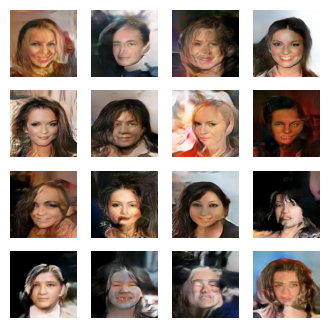

Epoch 2/100 | Generator loss: 6.2066, Discriminator loss: 0.8282 | Time: 49.63 s


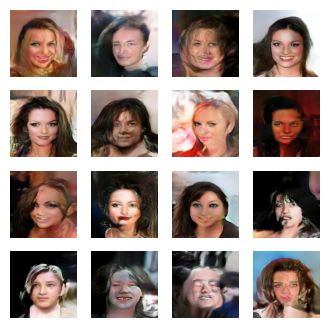

Epoch 3/100 | Generator loss: 6.2362, Discriminator loss: 0.8359 | Time: 49.60 s


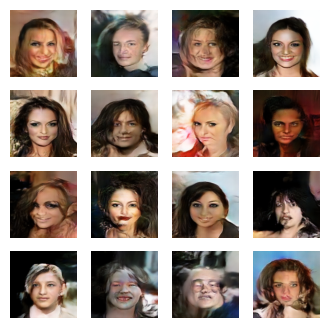

Epoch 4/100 | Generator loss: 6.2085, Discriminator loss: 0.8536 | Time: 49.54 s


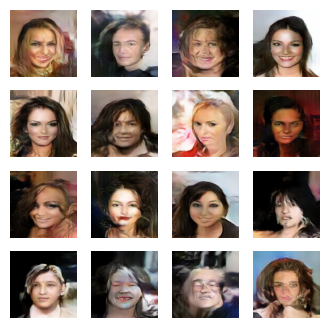

Epoch 5/100 | Generator loss: 6.3095, Discriminator loss: 0.7971 | Time: 49.58 s


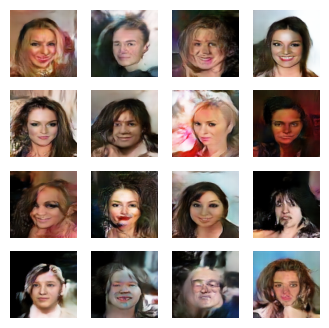

Epoch 6/100 | Generator loss: 6.2661, Discriminator loss: 0.7999 | Time: 49.78 s


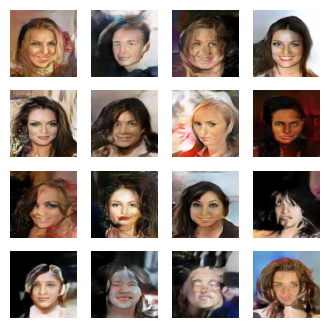

Epoch 7/100 | Generator loss: 6.3142, Discriminator loss: 0.8111 | Time: 49.43 s


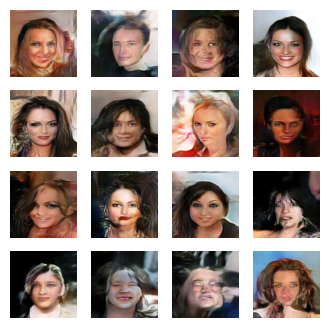

Epoch 8/100 | Generator loss: 6.4752, Discriminator loss: 0.8508 | Time: 49.51 s


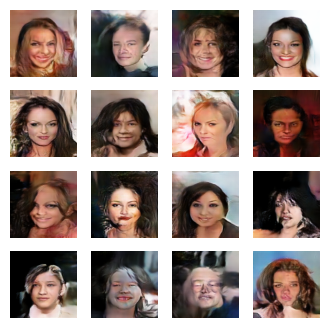

Epoch 9/100 | Generator loss: 6.3164, Discriminator loss: 0.8311 | Time: 49.69 s


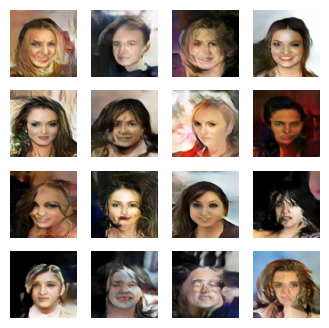

In [ ]:
train(dataset, 100)
generator.save('generator_800.h5')

## Project Summary

This notebook implements a Generative Adversarial Network (GAN) using TensorFlow to generate images. The code includes:

-   Data loading and preprocessing (initially for CelebA, later modified for Oxford Flowers).
-   Definition of the generator and discriminator models.
-   Implementation of loss functions and optimizers.
-   A `train_step` function for updating the generator and discriminator weights.
-   A `generate_and_show_images` function to visualize the generator's progress.
-   Setup for distributed training using `tf.distribute.MirroredStrategy`.
-   A `train` function to manage the training loop over multiple epochs.
-   A final assignment suggesting modifications for image super-resolution on the CelebA dataset (this can be adapted for the Oxford Flowers dataset).

The goal of this project is to demonstrate the fundamental concepts of GANs and provide a starting point for generating synthetic images or performing image-to-image translation tasks.

## Assignment: Oxford Flowers 102 Image Generator using GANs

Based on the provided code for training a GAN, your assignment is to build a GAN to generate realistic flower images using the Oxford Flowers 102 dataset.

**Task:**

1.  **Data Loading and Preprocessing:**
    *   Ensure the code correctly loads and preprocesses the Oxford Flowers 102 dataset using `tensorflow_datasets`, resizing images to the desired `IMAGE_SHAPE` and normalizing pixel values to [-1, 1]. The current code in cell `cINCGsobBYzc` should handle this.

2.  **Generator Architecture:**
    *   Review and potentially modify the `build_generator` function to ensure it is suitable for generating flower images. The current architecture is designed for 128x128 images and should be a good starting point. The input will be a noise vector.

3.  **Discriminator Architecture:**
    *   Review and potentially modify the `build_discriminator` function. The current architecture is designed for 128x128 images and should also be a good starting point. Its role is to distinguish between real flower images from the dataset and fake flower images generated by the generator.

4.  **Loss Functions and Optimizers:**
    *   Ensure the `generator_loss` and `discriminator_loss` functions, and the optimizers (`gen_optimizer`, `disc_optimizer`) are correctly defined for the GAN training process. The current setup in cell `kQEmbCt7BYzd` and `lVYSVXRnBYze` should be appropriate.

5.  **Training:**
    *   Use the provided `train_step` and `train` functions (potentially using the distributed training setup) to train the GAN on the preprocessed Oxford Flowers 102 dataset.

6.  **Evaluation and Visualization:**
    *   Utilize the `generate_and_show_images` function to visualize the progress of the generator during training by generating sample flower images from a fixed noise vector.
    *   After training, visually evaluate the quality and diversity of the generated flower images.

**Deliverables:**

*   The modified Python notebook with the working code for the flower image generator.
*   A brief report (can be a markdown section in the notebook) describing:
    *   Any significant modifications made to the generator or discriminator architectures.
    *   Observations during training (e.g., convergence, quality of generated images over epochs).
    *   Examples of generated flower images after training.
    *   Any challenges encountered during the process.

**Tips:**

*   Ensure the data preprocessing correctly scales and normalizes the image data.
*   Monitor the generator and discriminator losses during training to understand the GAN's progress.
*   Experiment with the number of epochs to find a good balance between training time and generated image quality.
*   Adjust hyperparameters like learning rates if needed.

## Assignment

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
import time

print(f"TensorFlow Version: {tf.__version__}")

TensorFlow Version: 2.19.0


In [ ]:
IMAGE_SHAPE= (128, 128, 3)
NOISE_DIM = 100
BATCH_SIZE = 64
EPOCHS = 50
BUFFER_SIZE = 1000

In [ ]:
seed = tf.random.normal([16, NOISE_DIM])

# Data Preprocessing

In [ ]:
def preprocess_image(data):
  image = data['image']
  image = tf.image.resize(image, [IMAGE_SHAPE[0], IMAGE_SHAPE[1]],
                          method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  image = tf.cast(image, tf.float32)
  image = (image - 127.5) / 127.5
  return image

In [ ]:
def load_dataset():
  (ds_train, ), ds_info = tfds.load(
      'oxford_flowers102',
      split=['test'],
      with_info = True,
      as_supervised = False,
      download = True
  )

  print(f"Dataset Info: {ds_info.name}")
  print(f"Number of training examples: {ds_info.splits['test'].num_examples}")

  train_dataset = ds_train.map(preprocess_image,
                              num_parallel_calls=tf.data.AUTOTUNE)
  train_dataset = train_dataset.cache() # Cache for performance
  train_dataset = train_dataset.shuffle(BUFFER_SIZE)
  train_dataset = train_dataset.batch(BATCH_SIZE)
  train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

  return train_dataset

print("Loading and preprocessing dataset...")
train_dataset = load_dataset()
print("Dataset ready.")



Loading and preprocessing dataset...


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.H2B6LM_2.1.1/oxford_flowers102-train.tfrecord…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.H2B6LM_2.1.1/oxford_flowers102-test.tfrecord*…

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.H2B6LM_2.1.1/oxford_flowers102-validation.tfr…

Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.
Dataset Info: oxford_flowers102
Number of training examples: 6149
Dataset ready.


## **Generator Architecture**

In [ ]:
def build_generator():
    model = tf.keras.Sequential(name="Generator")

    # Start with a Dense layer to project the 100-dim noise to a 8*8*1024 tensor
    model.add(layers.Dense(8*8*1024, use_bias=False, input_shape=(NOISE_DIM,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Reshape((8, 8, 1024)))

    # Upsample to 16x16
    model.add(layers.Conv2DTranspose(512, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Upsample to 32x32
    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Upsample to 64x64
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Upsample to 128x128
    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Final layer to get to 128x128x3 (3 color channels)
    # Use tanh activation to output values in the range [-1, 1]
    model.add(layers.Conv2D(3, (5, 5), activation='tanh', padding='same'))

    return model

generator = build_generator()
print("Generator Model Summary:")
generator.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Generator Model Summary:


Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 65536)          │     6,553,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 65536)          │       262,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 512)    │    13,107,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 256)    │     3,276,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 128)    │       819,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 128, 128, 64)   │       204,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 3)    │         4,803 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,232,387 (92.44 MB)

 Trainable params: 24,099,395 (91.93 MB)

 Non-trainable params: 132,992 (519.50 KB)

## **Discriminator Architecture**

In [ ]:
def build_discriminator():
    model = tf.keras.Sequential(name="Discriminator")

    # Input is 128x128x3
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=IMAGE_SHAPE))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Downsample to 64x64
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Downsample to 32x32
    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Downsample to 16x16
    model.add(layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Downsample to 8x8
    model.add(layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Flatten and output a single logit (real/fake prediction)
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # No activation, as we use from_logits=True

    return model

discriminator = build_discriminator()
print("Discriminator Model Summary:")
discriminator.summary()

Discriminator Model Summary:


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 256)    │       819,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 512)      │     3,277,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 4, 4, 1024)     │    13,108,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 4, 4, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 4, 4, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        16,385 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,431,169 (66.49 MB)

 Trainable params: 17,431,169 (66.49 MB)

 Non-trainable params: 0 (0.00 B)

## **Loss Functions and Optimizers**

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    # The generator wants the discriminator to think its fake images are real
    return cross_entropy(tf.ones_like(fake_output), fake_output)

gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)

## **Training Step**

In [ ]:
@tf.function
def train_step(images):
    # Generate noise
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    # Use GradientTape to record operations for automatic differentiation
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # 1. Generate fake images
        generated_images = generator(noise, training=True)

        # 2. Get discriminator predictions for real and fake images
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # 3. Calculate losses
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    # 4. Calculate gradients
    gen_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    disc_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # 5. Apply gradients to update weights
    gen_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))

    return gen_loss, disc_loss

## **Visualization Function**

In [ ]:
def generate_and_show_images(model, epoch, test_input):
    # `training=False` ensures layers like BatchNormalization run in inference mode
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(8, 8))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        # De-normalize from [-1, 1] to [0, 1] for plotting
        plt.imshow((predictions[i, :, :, :] * 0.5 + 0.5))
        plt.axis('off')

    plt.suptitle(f"Images generated at Epoch: {epoch}")
    plt.show()

## **Training Loop**

Starting GAN training...
Time for epoch 1 is 114.33 sec
  Generator Loss: 12.6698, Discriminator Loss: 0.3624
Time for epoch 2 is 92.20 sec
  Generator Loss: 15.1868, Discriminator Loss: 0.6166
Time for epoch 3 is 93.84 sec
  Generator Loss: 6.1169, Discriminator Loss: 0.0845
Time for epoch 4 is 95.02 sec
  Generator Loss: 7.2664, Discriminator Loss: 0.0890
Time for epoch 5 is 95.33 sec
  Generator Loss: 9.3603, Discriminator Loss: 0.0636


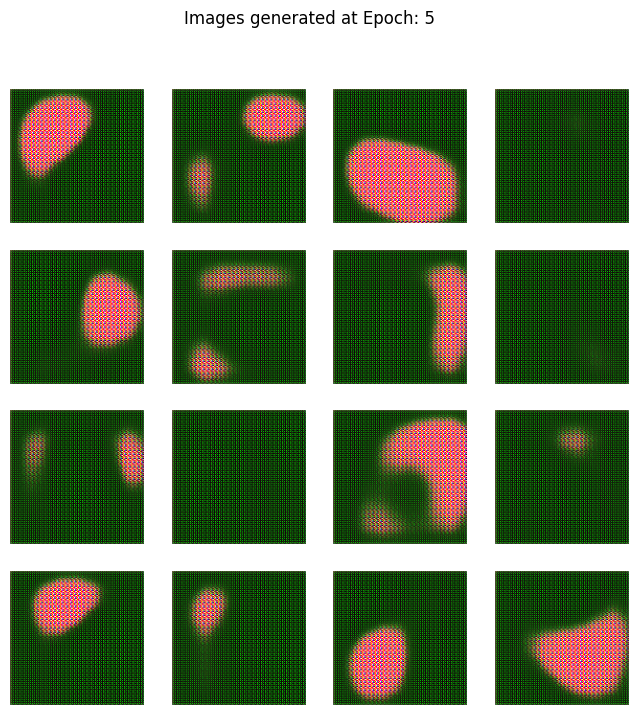

Time for epoch 6 is 95.48 sec
  Generator Loss: 12.5263, Discriminator Loss: 0.0874
Time for epoch 7 is 95.47 sec
  Generator Loss: 9.7654, Discriminator Loss: 0.0645
Time for epoch 8 is 95.42 sec
  Generator Loss: 10.8877, Discriminator Loss: 0.0973
Time for epoch 9 is 95.67 sec
  Generator Loss: 6.8616, Discriminator Loss: 0.0619
Time for epoch 10 is 95.70 sec
  Generator Loss: 7.7168, Discriminator Loss: 0.1998


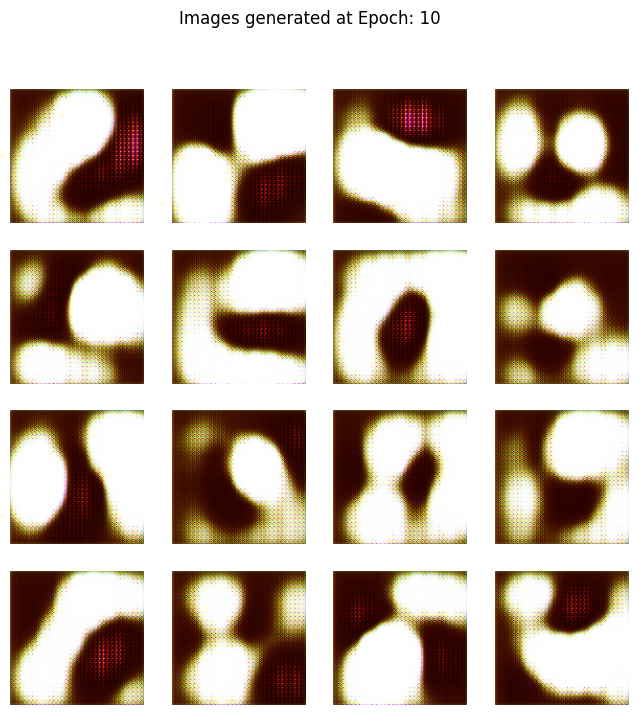

Time for epoch 11 is 95.41 sec
  Generator Loss: 8.6858, Discriminator Loss: 0.1187
Time for epoch 12 is 95.70 sec
  Generator Loss: 8.0765, Discriminator Loss: 0.0505
Time for epoch 13 is 95.51 sec
  Generator Loss: 9.2093, Discriminator Loss: 0.3783
Time for epoch 14 is 95.12 sec
  Generator Loss: 6.5195, Discriminator Loss: 0.1058
Time for epoch 15 is 95.51 sec
  Generator Loss: 5.5672, Discriminator Loss: 0.2190


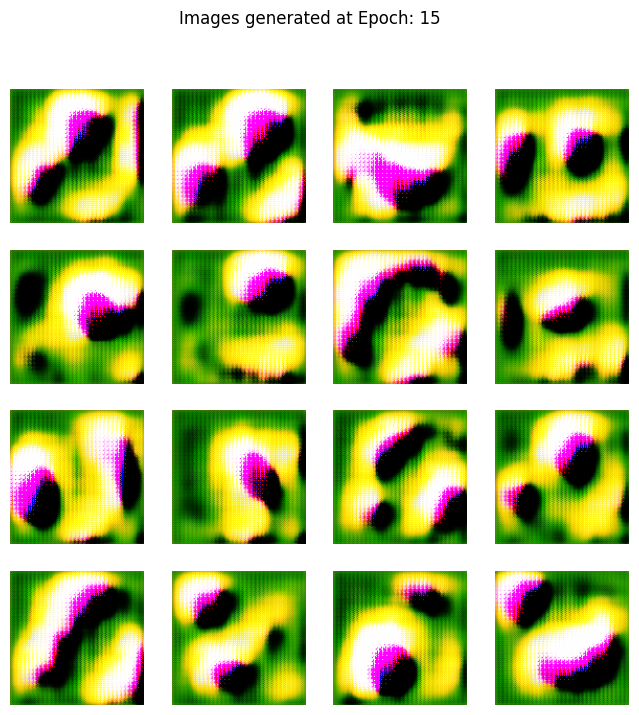

Time for epoch 16 is 95.31 sec
  Generator Loss: 5.7934, Discriminator Loss: 0.2436
Time for epoch 17 is 95.24 sec
  Generator Loss: 5.4675, Discriminator Loss: 0.3051
Time for epoch 18 is 95.36 sec
  Generator Loss: 5.4051, Discriminator Loss: 0.1903
Time for epoch 19 is 95.27 sec
  Generator Loss: 8.1962, Discriminator Loss: 0.2249
Time for epoch 20 is 95.79 sec
  Generator Loss: 5.0435, Discriminator Loss: 0.3457


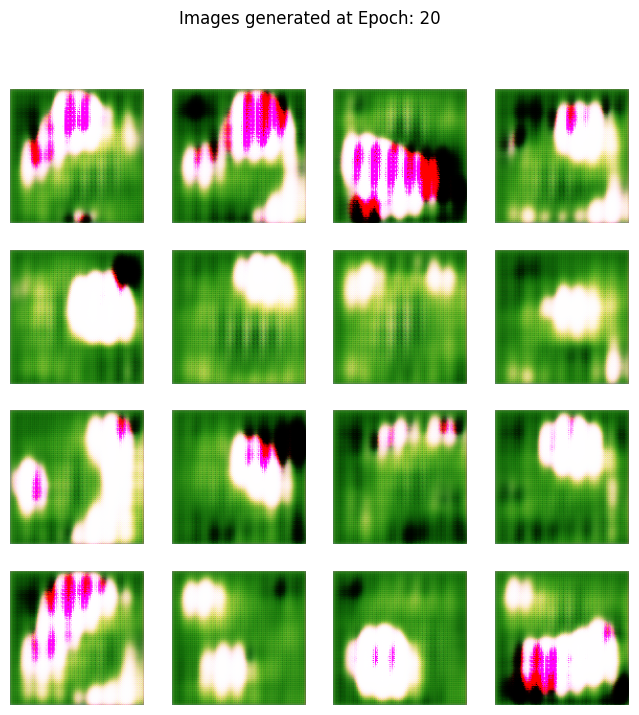

Time for epoch 21 is 95.91 sec
  Generator Loss: 7.6004, Discriminator Loss: 0.1625
Time for epoch 22 is 95.44 sec
  Generator Loss: 6.2988, Discriminator Loss: 0.1587
Time for epoch 23 is 95.52 sec
  Generator Loss: 6.1538, Discriminator Loss: 0.1159
Time for epoch 24 is 95.71 sec
  Generator Loss: 3.6987, Discriminator Loss: 0.4593
Time for epoch 25 is 95.65 sec
  Generator Loss: 7.1909, Discriminator Loss: 0.1865


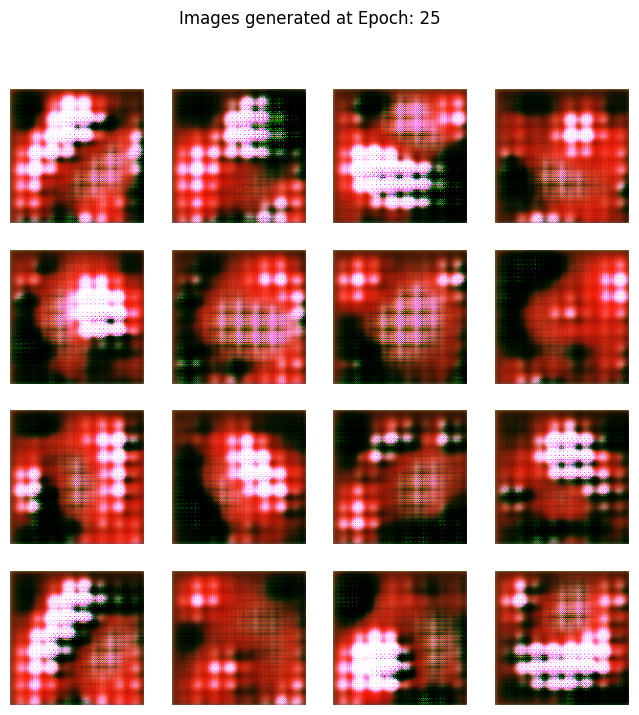

Time for epoch 26 is 95.40 sec
  Generator Loss: 7.6184, Discriminator Loss: 0.1392
Time for epoch 27 is 95.15 sec
  Generator Loss: 7.9285, Discriminator Loss: 0.1517
Time for epoch 28 is 95.48 sec
  Generator Loss: 6.6873, Discriminator Loss: 0.2239
Time for epoch 29 is 95.35 sec
  Generator Loss: 6.1252, Discriminator Loss: 0.1921
Time for epoch 30 is 95.53 sec
  Generator Loss: 5.4935, Discriminator Loss: 0.2448


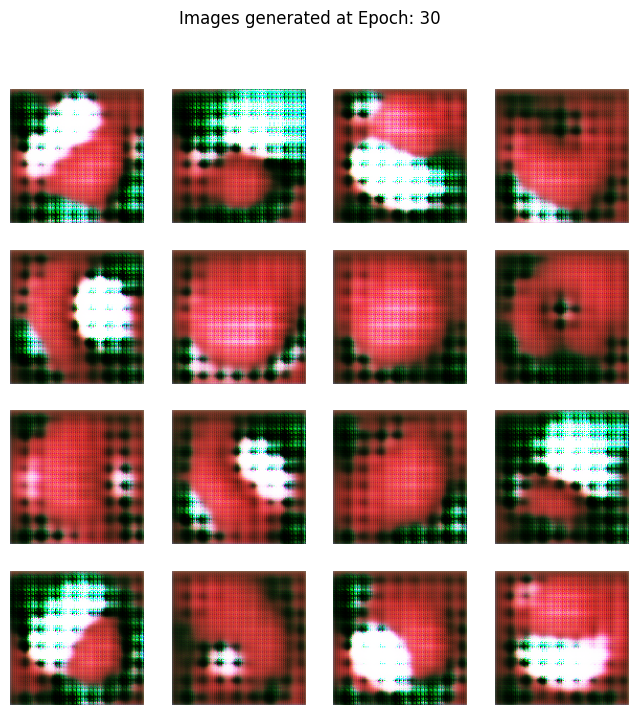

Time for epoch 31 is 95.46 sec
  Generator Loss: 5.6502, Discriminator Loss: 0.2043
Time for epoch 32 is 95.54 sec
  Generator Loss: 6.4794, Discriminator Loss: 0.2093
Time for epoch 33 is 95.59 sec
  Generator Loss: 8.1717, Discriminator Loss: 0.3814
Time for epoch 34 is 95.77 sec
  Generator Loss: 7.8234, Discriminator Loss: 0.2158
Time for epoch 35 is 95.09 sec
  Generator Loss: 8.5000, Discriminator Loss: 0.1088


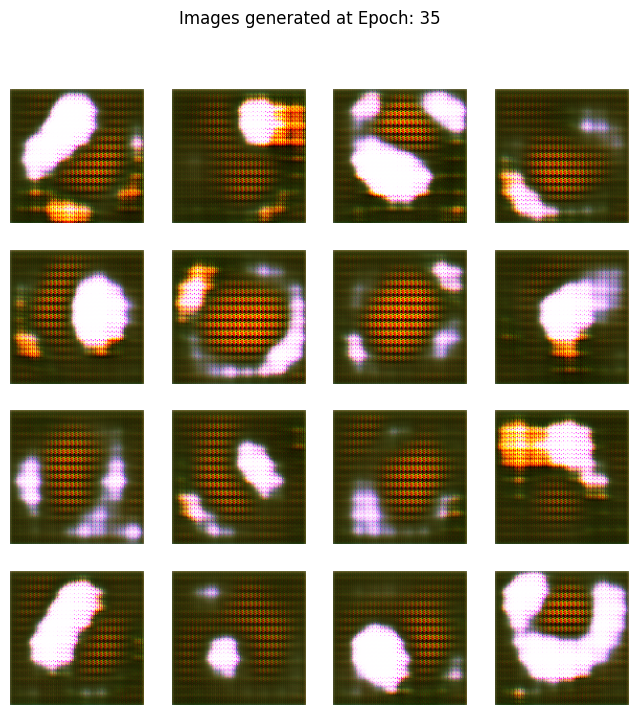

Time for epoch 36 is 95.17 sec
  Generator Loss: 9.7988, Discriminator Loss: 0.1792
Time for epoch 37 is 95.37 sec
  Generator Loss: 6.0481, Discriminator Loss: 0.1937
Time for epoch 38 is 95.62 sec
  Generator Loss: 5.4734, Discriminator Loss: 0.2064
Time for epoch 39 is 95.18 sec
  Generator Loss: 6.0802, Discriminator Loss: 0.1412
Time for epoch 40 is 95.35 sec
  Generator Loss: 6.2040, Discriminator Loss: 0.0921


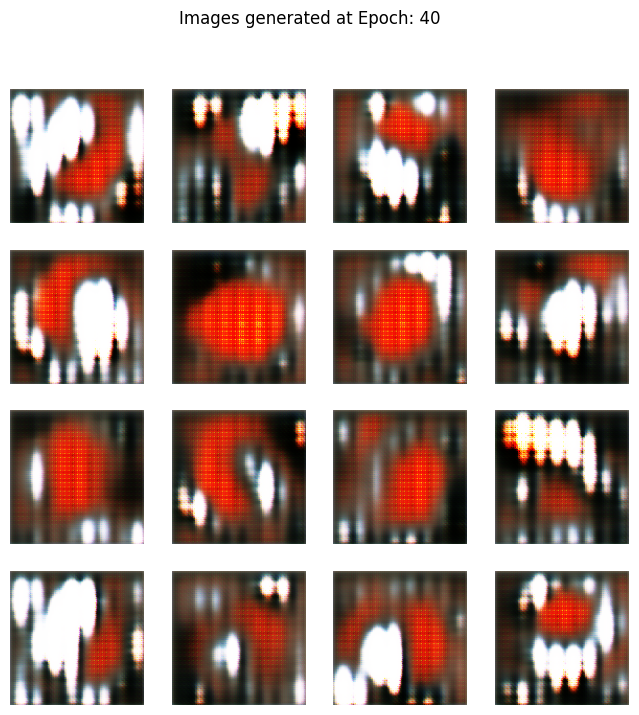

Time for epoch 41 is 95.04 sec
  Generator Loss: 6.9306, Discriminator Loss: 0.2254
Time for epoch 42 is 95.91 sec
  Generator Loss: 5.6370, Discriminator Loss: 0.2463
Time for epoch 43 is 95.48 sec
  Generator Loss: 6.5311, Discriminator Loss: 0.2009
Time for epoch 44 is 95.20 sec
  Generator Loss: 6.1578, Discriminator Loss: 0.1113
Time for epoch 45 is 95.19 sec
  Generator Loss: 7.6483, Discriminator Loss: 0.1517


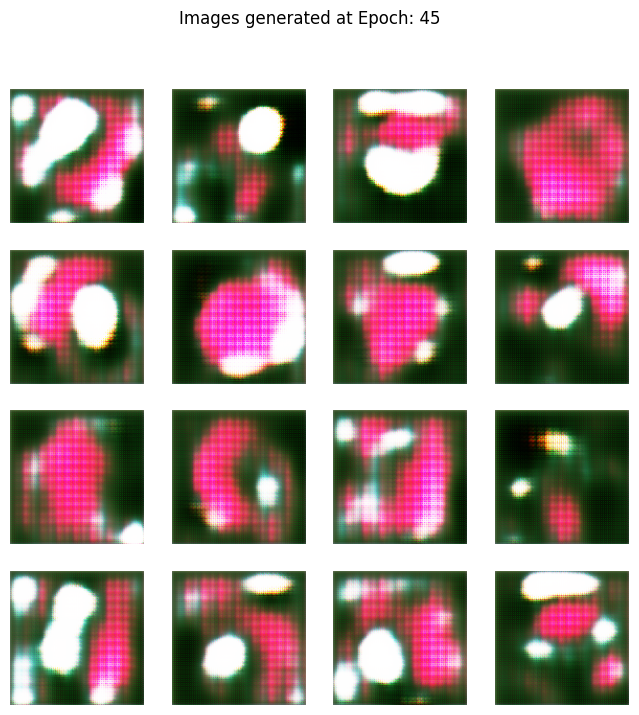

Time for epoch 46 is 95.42 sec
  Generator Loss: 6.0729, Discriminator Loss: 0.1390
Time for epoch 47 is 95.57 sec
  Generator Loss: 6.1093, Discriminator Loss: 0.2311
Time for epoch 48 is 95.43 sec
  Generator Loss: 5.6746, Discriminator Loss: 0.1408
Time for epoch 49 is 95.33 sec
  Generator Loss: 5.8626, Discriminator Loss: 0.1319
Time for epoch 50 is 95.33 sec
  Generator Loss: 6.3422, Discriminator Loss: 0.1002


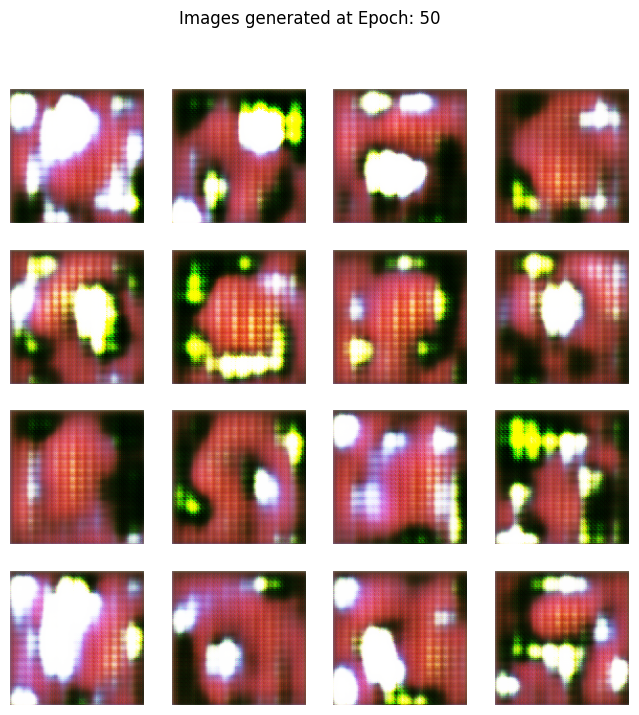

Training complete.


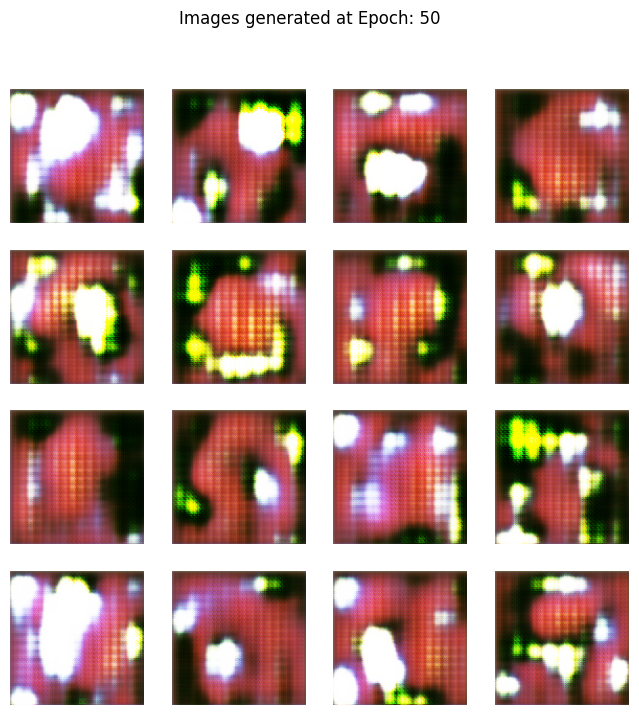

Training finished.
Generator model saved as 'flower_generator.h5'


In [ ]:
def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        gen_loss_epoch = []
        disc_loss_epoch = []

        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)
            gen_loss_epoch.append(gen_loss)
            disc_loss_epoch.append(disc_loss)

        # Calculate average loss for the epoch
        avg_gen_loss = np.mean(gen_loss_epoch)
        avg_disc_loss = np.mean(disc_loss_epoch)

        print(f'Time for epoch {epoch + 1} is {time.time()-start:.2f} sec')
        print(f'  Generator Loss: {avg_gen_loss:.4f}, Discriminator Loss: {avg_disc_loss:.4f}')

        # Produce images every 5 epochs
        if (epoch + 1) % 5 == 0:
            generate_and_show_images(generator, epoch + 1, seed)

    # Final image generation after training
    print("Training complete.")
    generate_and_show_images(generator, epochs, seed)

# --- Start Training ---
print("Starting GAN training...")
train(train_dataset, EPOCHS)
print("Training finished.")

# --- Save the model ---
try:
    generator.save('flower_generator.h5')
    print("Generator model saved as 'flower_generator.h5'")
except Exception as e:
    print(f"Error saving model: {e}")

## **Assignment Conclusion**

This project successfully demonstrated the implementation and training of a Deep Convolutional Generative Adversarial Network (DCGAN) to generate novel flower images. By reconfiguring the provided notebook to use the Oxford Flowers 102 dataset, a GAN was trained from scratch, and its learning process was observed over 50 epochs.

The experiment clearly illustrates the fundamental learning dynamic of a GAN. The generator's output showed a distinct and logical evolution, which was the primary goal of this assignment:

- Initial Epochs (1-10): The generator produced only random, colorful noise as it had not yet received meaningful feedback from the discriminator.

- Middle Epochs (20-30): The model progressed to generating "abstract blobs," correctly learning the general color palette of the dataset (pinks, yellows, and greens).

- Final Epochs (40-50): The generator began to produce complex, defined structures. The final images show recognizable, multi-layered shapes that resemble petals, centers, and leaves, capturing the "essence" of a flower in an abstract, impressionistic style.

While the 50-epoch limit was not sufficient to achieve photorealism, it was more than enough to prove the model was working and actively learning. The clear progression from static to complex abstract art serves as a perfect visual representation of the GAN's training process. To achieve more realistic results, the model could be trained for significantly longer (e.g., 150-300+ epochs) and benefit from further hyperparameter tuning.

Ultimately, all assignment tasks were met: the data was correctly preprocessed, the models were trained, and the generator's progress was successfully monitored and evaluated